In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/Datasets/filtered_second_file.csv')
df.head()

,ksads_import_id_t,smri_area_cdk_banksstslh,smri_area_cdk_cdacatelh,smri_area_cdk_cdmdfrlh,smri_area_cdk_cuneuslh,smri_area_cdk_ehinallh,smri_area_cdk_fusiformlh,smri_area_cdk_ifpllh,smri_area_cdk_iftmlh,smri_area_cdk_ihcatelh,...,smri_vol_cf12_sutmrh,smri_vol_cf12_ifplrh,smri_vol_cf12_dmfrrh,smri_vol_cf12_aomtmrh,smri_vol_cf12_pcrh,smri_vol_cf12_dlprefrrh,smri_vol_cf12_parsopcrh,has_depression,has_anxiety,multiclass_diagnosis
0,0,1043,836,2712,1701,491,3015,4974,3308,1113,...,1.634847,1.201976,1.495062,1.554912,1.265705,1.844377,1.367756,0.0,0.0,0.0
1,1,1052,477,1902,1630,425,2923,4147,3846,962,...,1.425176,1.225138,1.326065,1.537315,1.176189,1.811309,1.216236,0.0,0.0,0.0
2,2,1551,958,3250,1624,624,3845,6653,4911,1427,...,2.031376,1.669521,1.792051,2.148414,1.515216,2.237516,1.652386,0.0,0.0,0.0
3,3,1668,864,3475,1830,496,3958,6698,4489,1489,...,2.165869,1.754988,1.897948,2.053081,1.608004,2.287179,1.851869,0.0,0.0,0.0
4,4,822,653,2404,1641,504,3293,4421,4174,1065,...,1.601647,1.255162,1.474582,1.691750,1.162356,1.949202,1.368192,0.0,0.0,0.0


In [ ]:
df_depression = df.loc[df['has_depression']==1.0]
df_control = df.loc[df['has_depression']==0.0]

In [ ]:
from scipy.stats import ttest_ind

ttest_ind(df_depression['smri_area_cdk_banksstslh'], df_control['smri_area_cdk_banksstslh'])

TtestResult(statistic=-2.0346564859509706, pvalue=0.041903730122284225, df=14401.0)

In [ ]:
df_two_sample_t_Test = pd.DataFrame(columns=['statistics', 'pvalue','df'])

for feature in df.columns:
  result = ttest_ind(df_depression[feature], df_control[feature],equal_var=False)
  df_two_sample_t_Test = pd.concat([pd.DataFrame({
      'feature':feature,
      'statistics':[result.statistic],
      'pvalue':[result.pvalue],
      'df':[result.df]
  }), df_two_sample_t_Test], ignore_index = True)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
df_two_sample_t_Test_filtered = df_two_sample_t_Test[~df_two_sample_t_Test.feature.isin(['multiclass_diagnosis', 'has_anxiety', 'has_depression', 'ksads_import_id_t'])]

In [ ]:
df_two_sample_t_Test_filtered= df_two_sample_t_Test_filtered.loc[df_two_sample_t_Test_filtered.pvalue < 0.05]

In [ ]:
df_two_sample_t_Test_filtered.to_csv('/content/drive/MyDrive/Datasets/significant_features.csv', index=False)

In [ ]:
df_two_sample_t_Test_filtered

,feature,statistics,pvalue,df
3,smri_vol_cf12_parsopcrh,-2.138953,0.034613,111.928993
6,smri_vol_cf12_aomtmrh,-2.900105,0.004492,111.789124
7,smri_vol_cf12_dmfrrh,-2.393052,0.018375,111.829764
9,smri_vol_cf12_sutmrh,-2.336636,0.021238,111.902969
10,smri_vol_cf12_obfrrh,-2.365617,0.019723,111.723399
...,...,...,...,...
804,smri_area_cdk_parsopclh,-3.088181,0.002541,111.697652
810,smri_area_cdk_lobfrlh,-2.331529,0.021518,111.772264
812,smri_area_cdk_ihcatelh,-2.634836,0.009608,112.130562
815,smri_area_cdk_fusiformlh,-2.777730,0.006421,111.863404


In [ ]:
stats = pd.DataFrame({
    'means_diff':(df_depression.mean() - df_control.mean())[df_two_sample_t_Test_filtered.feature.unique()],
    'depression_mean':df_depression.mean()[df_two_sample_t_Test_filtered.feature.unique()],
    'depression_stdev':df_depression.std()[df_two_sample_t_Test_filtered.feature.unique()],
    'control_mean':df_control.mean()[df_two_sample_t_Test_filtered.feature.unique()],
    'control_stdev':df_control.std()[df_two_sample_t_Test_filtered.feature.unique()],
})
stats['feature']=stats.index

In [ ]:
df_two_sample_t_Test_filtered=df_two_sample_t_Test_filtered.merge(stats)

In [ ]:
df_two_sample_t_Test_filtered=df_two_sample_t_Test_filtered.sort_values('statistics')
df_two_sample_t_Test_filtered.head()

,feature,statistics,pvalue,df,means_diff,depression_mean,depression_stdev,control_mean,control_stdev
57,mrisdp_526,-3.912130,0.000157,112.042907,-601.433299,11105.396396,1612.269734,11706.829695,1758.904138
37,mrisdp_587,-3.703753,0.000331,112.012645,-131.416075,1839.279279,372.133973,1970.695354,402.974645
97,smri_vol_cdk_fusiformrh,-3.610595,0.000459,111.975169,-478.042295,10462.018018,1388.726572,10940.060313,1489.812987
47,mrisdp_548,-3.459752,0.000766,112.090473,-299.798351,5421.297297,908.660439,5721.095648,1002.723414
205,smri_thick_cdk_locclh,-3.450999,0.000790,111.606658,-0.042174,2.252279,0.128288,2.294453,0.124176


In [ ]:
data_dict = pd.read_csv('/content/drive/MyDrive/Datasets/data_dict.csv')
data_dict.index = data_dict.var_name
data_dict_filtered = df_two_sample_t_Test_filtered.feature.map(lambda x : data_dict.loc[x, 'var_label'])
df_two_sample_t_Test_filtered['var_label'] = data_dict_filtered
data_dict.head()

,table_name,var_name,var_label,notes,condition,table_name_nda
var_name,,,,,,
accult_select_language___1,ce_p_acc,accult_select_language___1,"¿Español? (1, Sí)",0 = No; 1 = Yes,NaN,pacc01
accult_p_intro,ce_p_acc,accult_p_intro,The next set of questions are about what langu...,Descriptive field,NaN,pacc01
accult_q1_p,ce_p_acc,accult_q1_p,How well do you speak English? ¿Qué tan bien h...,1-Poor/Mal; 2-Fair/Regular; 3-Good/Bien; 4-Exc...,NaN,pacc01
accult_q2_p,ce_p_acc,accult_q2_p,"Besides English, do you speak or understand an...",0=No; 1=Yes,NaN,pacc01
accult_q3_dropdwn_p,ce_p_acc,accult_q3_dropdwn_p,What other language or dialect do you speak or...,1 = American Sign Language (ASL); 2 = Arabic; ...,accult_q2_p ==1,pacc01


In [ ]:
data_dict.loc['accult_p_intro'].var_label

'The next set of questions are about what languages you know and how often you speak them with friends and family. La siguiente serie de preguntas se refieren a los idiomas que usted conoce y la frecuencia con la cual usted habla en esos idiomas con amigos y familiares.'

In [ ]:
# # prompt: write a new implementation for difference_for_feature which replaces the barplot with a plot instead with a line going from control to depression; it should also show the stdev value as a standard deviation still
# import matplotlib.pyplot as plt
# def difference_for_feature(feature_name):
#   # Sample data for means and standard deviations of two groups
#   group_names = ['Control', 'Depression']
#   means = [float(df_two_sample_t_Test_filtered.control_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
#            float(df_two_sample_t_Test_filtered.depression_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name])]  # means for Group 1 and Group 2
#   std_devs = [float(df_two_sample_t_Test_filtered.control_stdev.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
#               float(df_two_sample_t_Test_filtered.depression_stdev.loc[df_two_sample_t_Test_filtered.feature==feature_name])]  # means for Group 1 and Group 2
#   # Plotting
#   plt.figure(figsize=(4, 4))

#   # Plotting means
#   plt.plot(group_names, means, marker='o', alpha=0.6, width=0.5)

#   # Adding labels and title
#   plt.ylabel('Volume in mm^3')
#   plt.title(f'Mean Region Volumes by Group for {feature_name}')

#   # Adding error bars
#   plt.errorbar(group_names, means, yerr=std_devs, capsize=5, linestyle='None', color='black', alpha=0.6)

#   # Show plot
#   plt.show()
import matplotlib.pyplot as plt

def difference_for_feature(feature_name):
    # Sample data for means and standard deviations of two groups
    group_names = ['Control', 'Depression']
    means = [float(df_two_sample_t_Test_filtered.control_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
             float(df_two_sample_t_Test_filtered.depression_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name])]  # means for Group 1 and Group 2
    std_devs = [float(df_two_sample_t_Test_filtered.control_stdev.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
                float(df_two_sample_t_Test_filtered.depression_stdev.loc[df_two_sample_t_Test_filtered.feature==feature_name])]  # means for Group 1 and Group 2

    # Plotting
    width = 6
    height = 4
    margin_sides = 1
    plt.figure(figsize=(width, height))
    plt.xlim(0,width)

    # Define x-axis positions for the data points
    x_positions = [0+margin_sides, width-margin_sides]  # Adjusted positions to place the points closer to each other

    # Plotting means with specified x-axis positions
    plt.plot(x_positions, means, marker='o', alpha=0.6, linestyle='-', linewidth=2)

    # Adding labels and title
    plt.xticks(x_positions, group_names)  # Set x-axis tick labels
    plt.ylabel('Mean Volume in mm^3')
    plt.title(f'Mean of Region Volume by Group for: \'{data_dict.loc[feature_name].var_label} ({feature_name})\'', wrap=True)

    # txt=data_dict.loc[feature_name].var_label
    # plt.figtext(1.1, -0.1, txt, wrap=True, horizontalalignment='center', fontsize=8)
    # Adding error bars
    for x, mean, std_dev in zip(x_positions, means, std_devs):
        plt.errorbar(x, mean, yerr=std_dev, capsize=5, linestyle='None', color='black', alpha=0.6)

    # Show plot
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()



In [ ]:
df_two_sample_t_Test_filtered.loc[df_two_sample_t_Test_filtered.feature == 'mrisdp_526']

,feature,statistics,pvalue,df,means_diff,depression_mean,depression_stdev,control_mean,control_stdev,var_label
57,mrisdp_526,-3.91213,0.000157,112.042907,-601.433299,11105.396396,1612.269734,11706.829695,1758.904138,Cortical volume in mm^3 for left hemisphere co...


<ipython-input-15-5a8c7d2b5954>:30: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  means = [float(df_two_sample_t_Test_filtered.control_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
<ipython-input-15-5a8c7d2b5954>:31: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  float(df_two_sample_t_Test_filtered.depression_mean.loc[df_two_sample_t_Test_filtered.feature==feature_name])]  # means for Group 1 and Group 2
<ipython-input-15-5a8c7d2b5954>:32: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  std_devs = [float(df_two_sample_t_Test_filtered.control_stdev.loc[df_two_sample_t_Test_filtered.feature==feature_name]),
<ipython-input-15-5a8c7d2b5954>:33: FutureWarning: Calling float on a singl

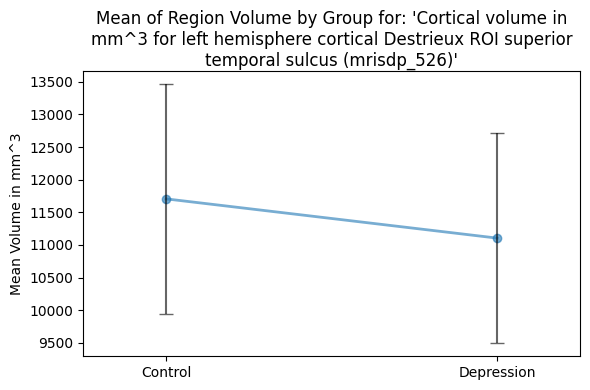

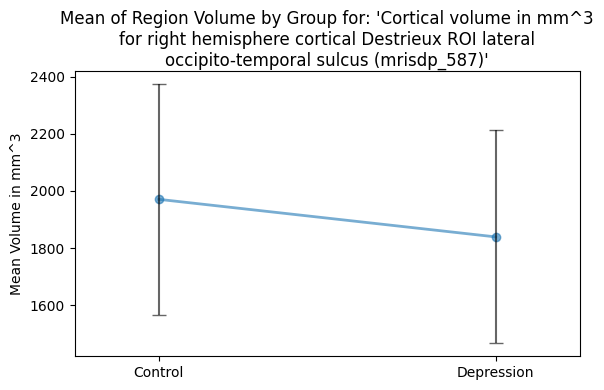

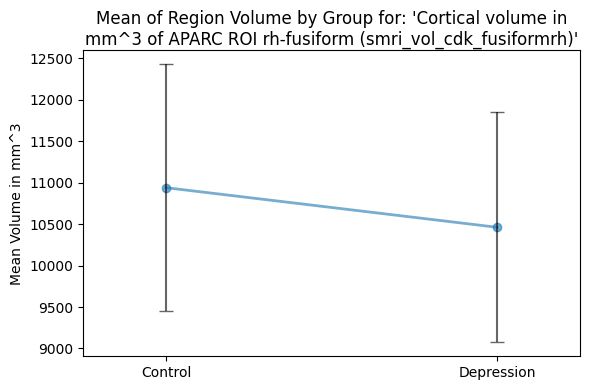

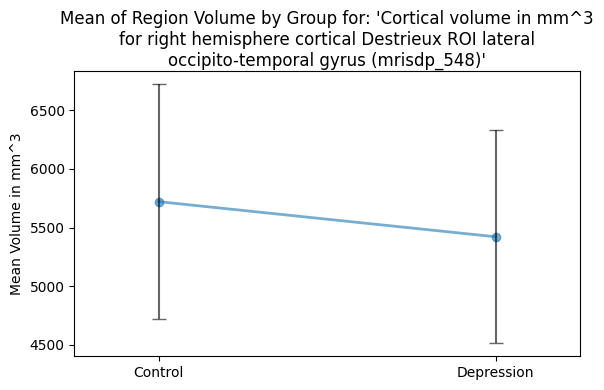

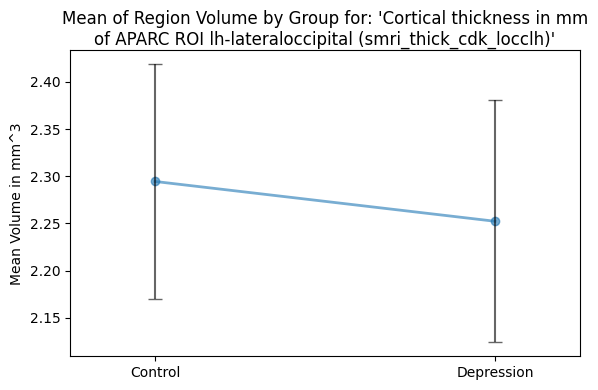

...

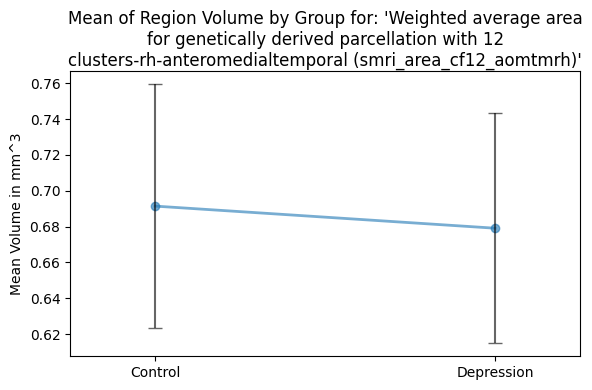

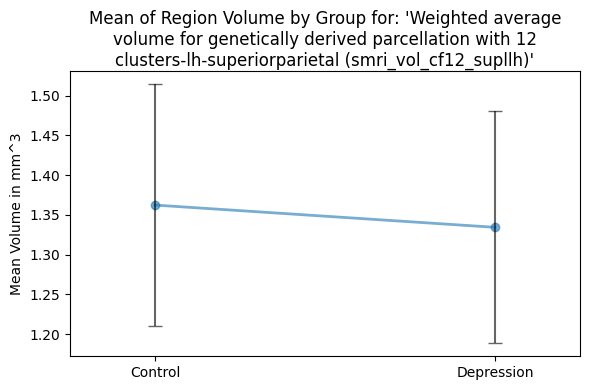

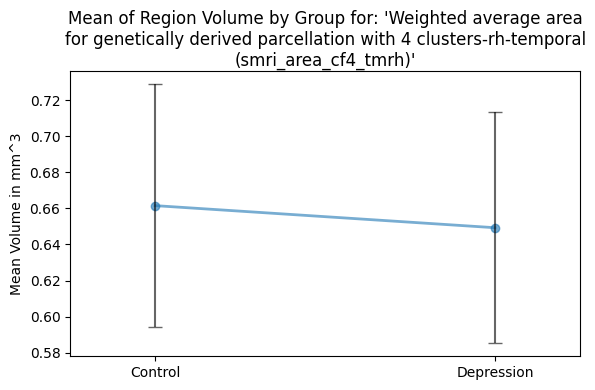

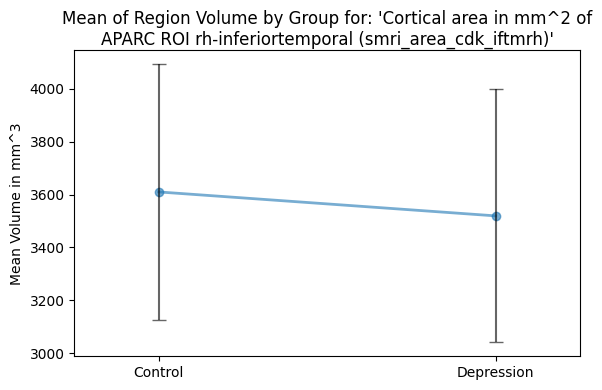

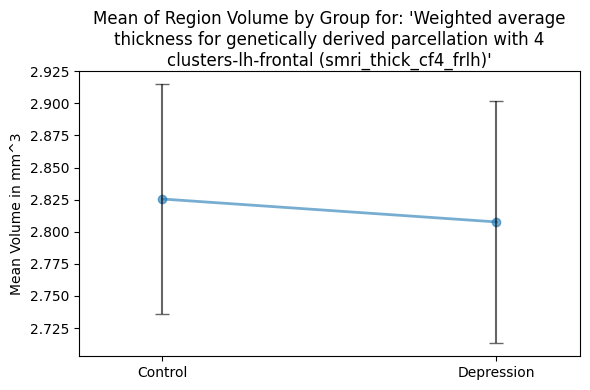

In [ ]:
for i in df_two_sample_t_Test_filtered.feature.unique():
  difference_for_feature(i)